# MMS Auralization with spaudiopy

In [1]:
import numpy as np
import spaudiopy as spa
import IPython

import pandas as pd
import urllib.request # for pulling audifications and plots directly from CDAWeb
import wget # for downloading audifications

In [2]:
# sampling frequency
fs = 44100
# define a mono input signal:
sig_in = pd.read_csv('output/THG_L2_MAG_PG0__000_000_Output_mono.csv')['M'].to_numpy()
IPython.display.Audio(sig_in, rate = fs)          # play audio in Jupyter notebook

## Load loudspeaker layout, specific to instrumentation:

/mnt/c/Users/kvc2/Documents/Space Science Institute/spaudiopy/spaudiopy/utils.py:52: RuntimeWarning: invalid value encountered in divide
  zen = np.arccos(z / r) if not steady_zen else \


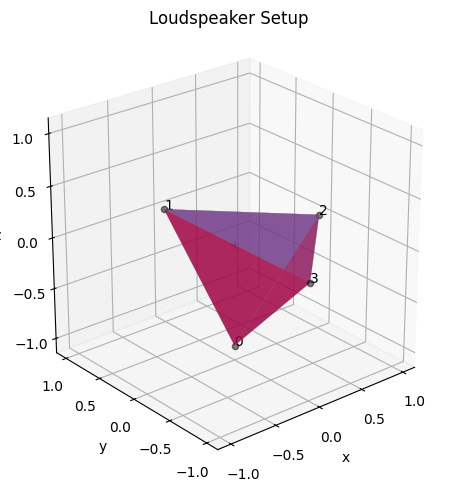

In [3]:
# load a loudspeaker layout
# ls_layout = spa.io.load_layout('ls_layouts/Aalto_subset_C.json')
ls_layout = spa.io.load_layout('ls_layouts/MMS.json')
ls_layout.show()

## Set up signals array 
4 channels x number of samples.

Our data: 

Start: `2016/12/09 09:00:00.000`
Stop: `2016/12/09 09:05:00.000`

https://svs.gsfc.nasa.gov/4639

In [4]:
# define auralization (front)
src_coords = [1, 10, -50]
# define decoding, using vbap as simple example
ls_gains = spa.decoder.vbap(src_coords, ls_layout)
ls_sigs = ls_layout.loudspeaker_signals(ls_gains, sig_in)

In [5]:
ls_sigs.shape

(4, 604800)

In [6]:
type(ls_sigs)

numpy.ndarray

In [7]:
df = pd.read_csv('data/MMS1_SCM_BRST_L2_SCB_4142755_000_000_Output_mono.csv')
sig1 = df['M'].to_numpy()
df = pd.read_csv('data/MMS2_SCM_BRST_L2_SCB_4142755_001_000_Output_mono.csv')
sig2 = df['M'].to_numpy()
df = pd.read_csv('data/MMS3_SCM_BRST_L2_SCB_4142755_002_000_Output_mono.csv')
sig3 = df['M'].to_numpy()
df = pd.read_csv('data/MMS4_SCM_BRST_L2_SCB_4142755_003_000_Output_mono.csv')
sig4 = df['M'].to_numpy()

In [8]:
sig1.shape

(2457564,)

In [9]:
sig2 = sig2[:len(sig1)]
sig3 = sig3[:len(sig1)]
sig4 = sig4[:len(sig1)]

In [10]:
sig3.shape

(2457564,)

In [11]:
sig4.shape

(2457564,)

In [12]:
ls_sigs = np.stack((sig1, sig2, sig3, sig4), axis=0)
ls_sigs.shape

(4, 2457564)

In [13]:
# df = pd.read_csv('data/MMS2_SCM_BRST_L2_SCHB_4013143.csv', on_bad_lines='warn')
# df

In [14]:
2457564/22000

111.70745454545454

## Binauralize

In [15]:
# # define auralization (front)
# src_coords = [1, 10, -50]
# # define decoding, using vbap as simple example
# ls_gains = spa.decoder.vbap(src_coords, ls_layout)
# ls_sigs = ls_layout.loudspeaker_signals(ls_gains, sig_in)
import soundfile

# binaural simulation of this setup
s_left, s_right = ls_layout.binauralize(ls_sigs, fs)

# for convenience we could now make a signal object and listen to it
# spa.sig.MultiSignal([s_left, s_right], fs=fs).play()
audio = np.array([s_left, s_right]).T

# TODO: Save wav file with fs = 22000 
soundfile.write("output/MMS.wav", audio, 22000) 

IPython.display.Audio([s_left, s_right],rate=22000)


### Code used to convert audified files to numpy arrays